# Vector fields and developmental trajectories of tissue development in three-dimensional space

In [1]:
import os, warnings
from pathlib import Path

import numpy as np
import dynamo as dyn
import spateo as st
import scanpy as sc
warnings.filterwarnings('ignore')

/home/pc001/anaconda3/envs/BioProjects/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/pc001/anaconda3/envs/BioProjects/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/pc001/anaconda3/envs/BioProjects/lib/python3.8/site-packag

## Load the data

In [2]:
sample_id = "E7_8h"
os.chdir(f"/media/pc001/Yao/Projects/Project_spateo/mouse_heart/figure6")
cpo = [(41, 1209, 57), (13, 8, -3), (0, 0, 1)]

out_h5ad_path = f"droso_{sample_id}_GBA_morpho/h5ad"
out_image_path = f"droso_{sample_id}_GBA_morpho/image/GBA_morphofield"
Path(out_h5ad_path).mkdir(parents=True, exist_ok=True)
Path(out_image_path).mkdir(parents=True, exist_ok=True)

In [3]:
germ_adata = st.read_h5ad(f"/media/pc001/Yao/Projects/Project_drosophila/Data_v4/migration-hotspot/drosophila_E7_8h_germ_layer_new/h5ad/{sample_id}_germband_v3.h5ad")
germ_adata = germ_adata[germ_adata.obs["anno_tissue_new"] != "epidermis", :]
germ_adata = germ_adata[germ_adata.layers["X_counts"].sum(axis=1)!=0, germ_adata.layers["X_counts"].sum(axis=0)!=0]
germ_adata.X = germ_adata.layers["X_counts"].copy()
germ_adata

View of AnnData object with n_obs × n_vars = 12585 × 8120
    obs: 'area', 'slices', 'anno_cell_type', 'anno_tissue', 'anno_germ_layer', 'actual_stage', 'scc', 'anno_tissue_new', 'V_z', 'anno_germ_layer_new', 'backbone_nodes', 'backbone_scc', 'segments'
    uns: 'glm_degs', 'log1p', 'pp'
    obsm: '2d_realign_spatial', '3d_align_spatial', 'V_cells_mapping', 'X_cells_mapping', 'X_pca', 'X_umap', 'raw_spatial', 'tdr_spatial'
    layers: 'X_counts', 'spliced', 'unspliced'

In [4]:
amn_adata = st.read_h5ad(os.path.join(out_h5ad_path, f"E7_8h_mapping_amnioserosa.h5ad"))
amn_adata = amn_adata[amn_adata.layers["X_counts"].sum(axis=1)!=0, amn_adata.layers["X_counts"].sum(axis=0)!=0]
amn_adata.X = amn_adata.layers["X_counts"].copy()
amn_adata

View of AnnData object with n_obs × n_vars = 769 × 6729
    obs: 'area', 'slices', 'anno_cell_type', 'anno_tissue', 'anno_germ_layer', 'actual_stage', 'scc', 'anno_tissue_new'
    uns: '__type'
    obsm: '2d_realign_spatial', '3d_align_spatial', 'V_cells_mapping', 'X_cells_mapping', 'X_pca', 'X_umap', 'raw_spatial', 'tdr_spatial'
    layers: 'X_counts', 'spliced', 'unspliced'

In [5]:
import anndata as ad
germ_adata = ad.concat([germ_adata, amn_adata], axis=0, join='outer')

In [6]:
germ_pc, _ = st.tdr.construct_pc(
    adata=germ_adata.copy(),
    spatial_key="3d_align_spatial",
    groupby="anno_tissue_new",
    key_added="tissue",
    colormap={"amnioserosa": "#bdcf32", "CNS": "#ea5545", "hindgut": "#27aeef", "midgut": "#87bc45", "muscle": "#f46a9b", "salivary gland": "#ef9b20",},
)

amn_pc, _ = st.tdr.construct_pc(
    adata=amn_adata.copy(),
    spatial_key="3d_align_spatial",
    groupby="anno_tissue_new",
    key_added="tissue",
    colormap={"amnioserosa": "#bdcf32", "CNS": "#ea5545", "hindgut": "#27aeef", "midgut": "#87bc45", "muscle": "#f46a9b", "salivary gland": "#ef9b20",},
)

## Calculate the developmental Vectorfield

In [ ]:
st.tdr.morphofield_sparsevfc(
    adata=germ_adata,
    spatial_key="3d_align_spatial",
    V_key="V_cells_mapping",
    key_added="VecFld_morpho",
    M=769+12585,
    lambda_=1e-3,
    NX=None,
    inplace=True,
)
germ_pc.point_data["vectors"] = germ_adata.uns["VecFld_morpho"]["V"]

|-----? grid_num and NX are both None, using `grid_num = [50,50,50]`.
|-----> Learn a continuous mapping from space to gene expression pattern
|-----> Generate grid...
|-----> Creating a Convex Hull...
|-----> Identify grid points within the Convex Hull...
|-----? The length of [  0 100 200 300 400] is different from 10, using `np.range(restart_num) * 100
|-----> [SparseVFC] begins...
|-----> Sampling control points based on data velocity magnitude...


In [7]:
st.tdr.morphofield_sparsevfc(
    adata=amn_adata,
    spatial_key="3d_align_spatial",
    V_key="V_cells_mapping",
    key_added="VecFld_morpho",
    NX=np.asarray(amn_adata.obsm['3d_align_spatial']),
    inplace=True,
)
amn_pc.point_data["vectors"] = amn_adata.uns["VecFld_morpho"]["V"]

|-----? The length of [  0 100 200 300 400] is different from 10, using `np.range(restart_num) * 100
|-----> [SparseVFC] begins...
|-----> Sampling control points based on data velocity magnitude...
|-----> [SparseVFC] completed [0.0303s]
|-----> [morphofield] in progress: 100.0000%
|-----> [morphofield] finished [0.1070s]


|-----? The number of start_points is more than 500. You may want to lower the max number of arrows to draw.


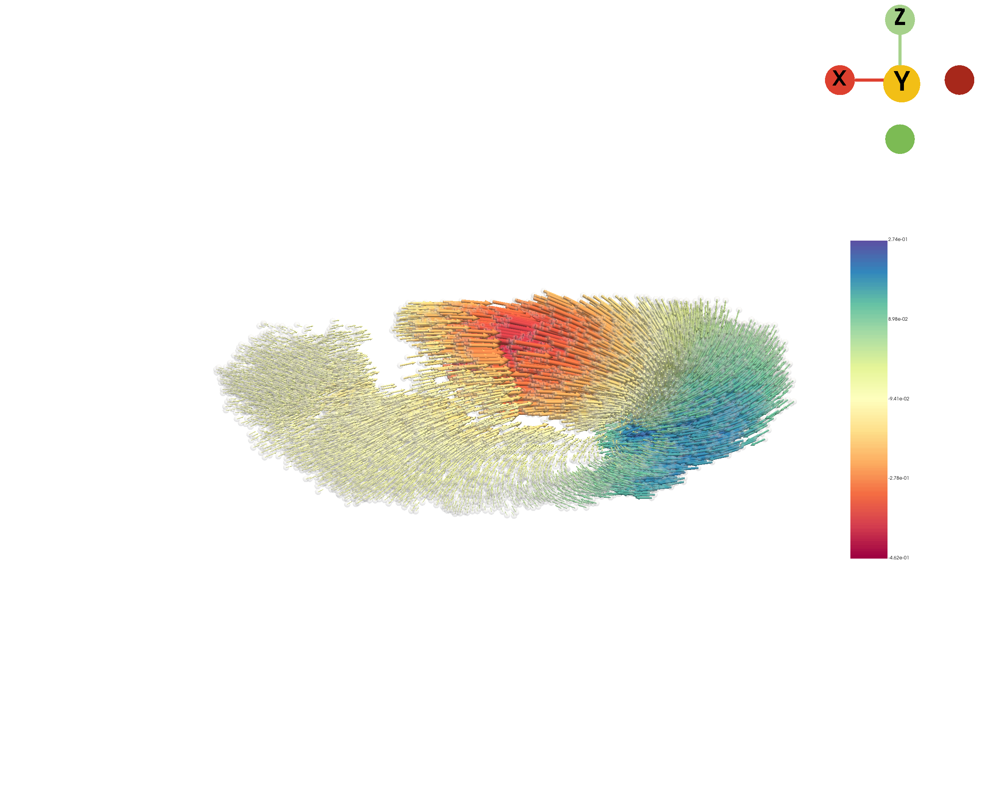

|-----? The number of start_points is more than 500. You may want to lower the max number of arrows to draw.


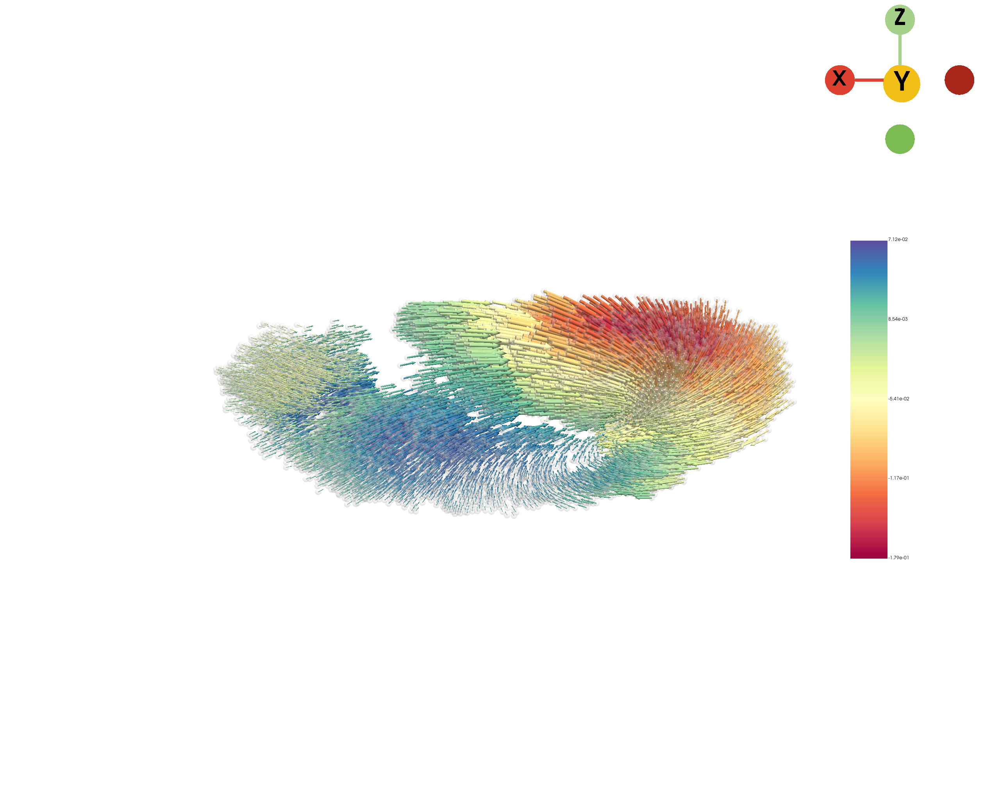

In [11]:
for i, k in zip([0, 2], ["V_x", "V_z"]):
    vector_arrows1,_ = st.tdr.construct_field(
        model=germ_pc,
        vf_key="vectors",
        arrows_scale_key="vectors",
        n_sampling=None,
        factor=100,
        key_added=k,
        label=germ_pc.point_data["vectors"][:, i].flatten(),
        color= "rainbow",
    )
    st.pl.three_d_plot(
        model=st.tdr.collect_models([germ_pc, vector_arrows1]),
        key=["tissue", k],
        colormap=["gainsboro", "Spectral"],
        opacity=[0.2, 1],
        model_style=["points", "surface"],
        model_size=[16, 5],
        jupyter="static",
        background="white",
        window_size=(2560, 2048),
        cpo=cpo,
        filename=os.path.join(out_image_path, f"GB_morphofield_vector_arrows_pc_model_{k}.pdf")
    )

In [ ]:
for i, k in zip([0, 2], ["V_x", "V_z"]):
    vector_arrows1,_ = st.tdr.construct_field(
        model=amn_pc,
        vf_key="vectors",
        arrows_scale_key="vectors",
        n_sampling=None,
        factor=20000,
        key_added=k,
        label=amn_pc.point_data["vectors"][:, i].flatten(),
        color= "rainbow",
    )
    st.pl.three_d_plot(
        model=st.tdr.collect_models([amn_pc, vector_arrows1]),
        key=["tissue", k],
        colormap=["gainsboro", "Spectral"],
        opacity=[0.2, 1],
        model_style=["points", "surface"],
        model_size=[16, 5],
        jupyter="static",
        background="white",
        window_size=(2560, 2048),
        cpo=cpo,
        filename=os.path.join(out_image_path, f"amnioserosa_morphofield_vector_arrows_pc_model_{k}.pdf")
    )

## Predict the cell developmentalal trajectory

In [24]:
st.tdr.morphopath(
    adata=amn_adata,
    # layer="log1p_X",
    vf_key="VecFld_morpho",
    key_added="fate_morpho",
    t_end=50000,
    interpolation_num=50,
    cores=20
)

|-----> [Running TRN] in progress: 100.0000%|-----> [Running TRN] completed [6.8141s]


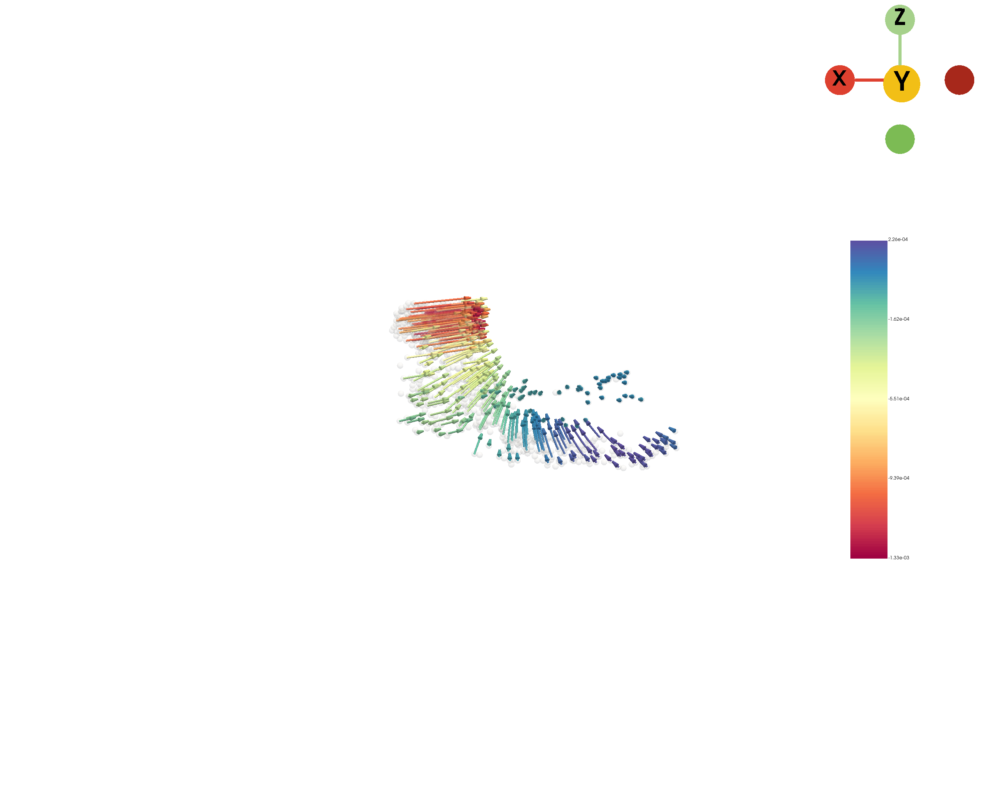

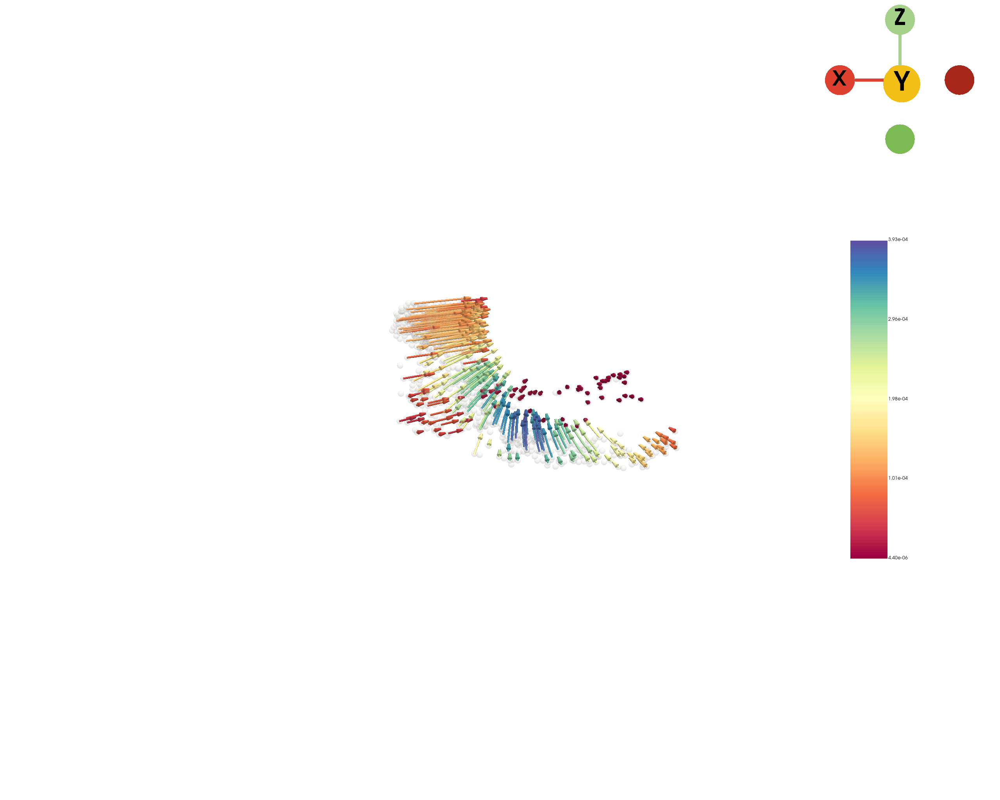

In [25]:
trajectory_model, _ = st.tdr.construct_trajectory(
    adata=amn_adata,
    fate_key="fate_morpho",
    n_sampling=300,
    sampling_method="trn",
    key_added="obs_index",
    label=np.asarray(amn_adata.obs.index), # stage1_tissue_adata.uns["VecFld_morpho"]["V"][:, 2].flatten(),
)
for i, k in zip([0, 2], ["V_x", "V_z"]):
    amn_adata.obs[k] = amn_adata.uns["VecFld_morpho"]["V"][:, i].flatten()
    st.tdr.add_model_labels(
        model=trajectory_model,
        key_added=k,
        labels=np.asarray(amn_adata[np.asarray(trajectory_model.point_data["obs_index"])].obs[k]),
        colormap="Spectral",
        where="point_data",
        inplace=True,
    )
    st.pl.three_d_plot(
        model=st.tdr.collect_models([amn_pc, trajectory_model]),
        key=["tissue", k],
        opacity=[0.2, .5],
        model_style=["points", "wireframe"],
        model_size=[16, 5],
        colormap=["gainsboro", "Spectral"],
        jupyter="static",
        background="white",
        window_size=(2560, 2048),
        cpo=cpo,
        filename=os.path.join(out_image_path, f"amnioserosa_morphofield_trajectory_pc_model_{k}.pdf")
    )

## Morphogenic features

In [9]:
st.tdr.morphofield_velocity(adata=germ_adata, vf_key="VecFld_morpho", key_added="morpho_velocity",)
st.tdr.morphofield_acceleration(adata=germ_adata, vf_key="VecFld_morpho", key_added="morpho_acceleration",)
st.tdr.morphofield_curvature(adata=germ_adata, vf_key="VecFld_morpho", key_added="morpho_curvature")
st.tdr.morphofield_curl(adata=germ_adata, vf_key="VecFld_morpho", key_added="morpho_curl",)
st.tdr.morphofield_torsion(adata=germ_adata, vf_key="VecFld_morpho", key_added="morpho_torsion",)
st.tdr.morphofield_divergence(adata=germ_adata, vf_key="VecFld_morpho", key_added="morpho_divergence",)
germ_adata

|-----> [Calculating acceleration] in progress: 100.0000%|-----> [Calculating acceleration] completed [0.0709s]
|-----> [Calculating acceleration] in progress: 100.0000%|-----> [Calculating acceleration] completed [0.0631s]
|-----> [Calculating curvature] in progress: 100.0000%|-----> [Calculating curvature] completed [0.1063s]


Calculating 3-D curl: 100%|██████████| 13354/13354 [00:00<00:00, 84388.09it/s]


|-----> [Calculating acceleration] in progress: 100.0000%|-----> [Calculating acceleration] completed [0.0552s]


Calculating divergence: 100%|██████████| 14/14 [00:00<00:00, 101.48it/s]


AnnData object with n_obs × n_vars = 13354 × 8125
    obs: 'area', 'slices', 'anno_cell_type', 'anno_tissue', 'anno_germ_layer', 'actual_stage', 'scc', 'anno_tissue_new', 'V_z', 'anno_germ_layer_new', 'backbone_nodes', 'backbone_scc', 'segments', 'morpho_acceleration', 'morpho_curvature', 'morpho_curl', 'morpho_torsion', 'morpho_divergence'
    uns: 'VecFld_morpho', 'morpho_torsion'
    obsm: '2d_realign_spatial', '3d_align_spatial', 'V_cells_mapping', 'X_cells_mapping', 'X_pca', 'X_umap', 'raw_spatial', 'tdr_spatial', 'morpho_velocity', 'morpho_acceleration', 'morpho_curvature', 'morpho_curl'
    layers: 'X_counts', 'spliced', 'unspliced'

In [9]:
st.tdr.morphofield_velocity(adata=amn_adata, vf_key="VecFld_morpho", key_added="morpho_velocity",)
st.tdr.morphofield_acceleration(adata=amn_adata, vf_key="VecFld_morpho", key_added="morpho_acceleration",)
st.tdr.morphofield_curvature(adata=amn_adata, vf_key="VecFld_morpho", key_added="morpho_curvature")
st.tdr.morphofield_curl(adata=amn_adata, vf_key="VecFld_morpho", key_added="morpho_curl",)
st.tdr.morphofield_torsion(adata=amn_adata, vf_key="VecFld_morpho", key_added="morpho_torsion",)
st.tdr.morphofield_divergence(adata=amn_adata, vf_key="VecFld_morpho", key_added="morpho_divergence",)
amn_adata

|-----> [Calculating acceleration] in progress: 100.0000%|-----> [Calculating acceleration] completed [0.0215s]
|-----> [Calculating acceleration] in progress: 100.0000%|-----> [Calculating acceleration] completed [0.0195s]
|-----> [Calculating curvature] in progress: 100.0000%|-----> [Calculating curvature] completed [0.0221s]


Calculating 3-D curl: 100%|██████████| 769/769 [00:00<00:00, 81927.91it/s]

|-----> [Calculating acceleration] in progress: 100.0000%|-----> [Calculating acceleration] completed [0.0196s]



Calculating divergence: 100%|██████████| 1/1 [00:00<00:00, 122.71it/s]


AnnData object with n_obs × n_vars = 769 × 6729
    obs: 'area', 'slices', 'anno_cell_type', 'anno_tissue', 'anno_germ_layer', 'actual_stage', 'scc', 'anno_tissue_new', 'morpho_acceleration', 'morpho_curvature', 'morpho_curl', 'morpho_torsion', 'morpho_divergence'
    uns: '__type', 'VecFld_morpho', 'morpho_torsion'
    obsm: '2d_realign_spatial', '3d_align_spatial', 'V_cells_mapping', 'X_cells_mapping', 'X_pca', 'X_umap', 'raw_spatial', 'tdr_spatial', 'morpho_velocity', 'morpho_acceleration', 'morpho_curvature', 'morpho_curl'
    layers: 'X_counts', 'spliced', 'unspliced'

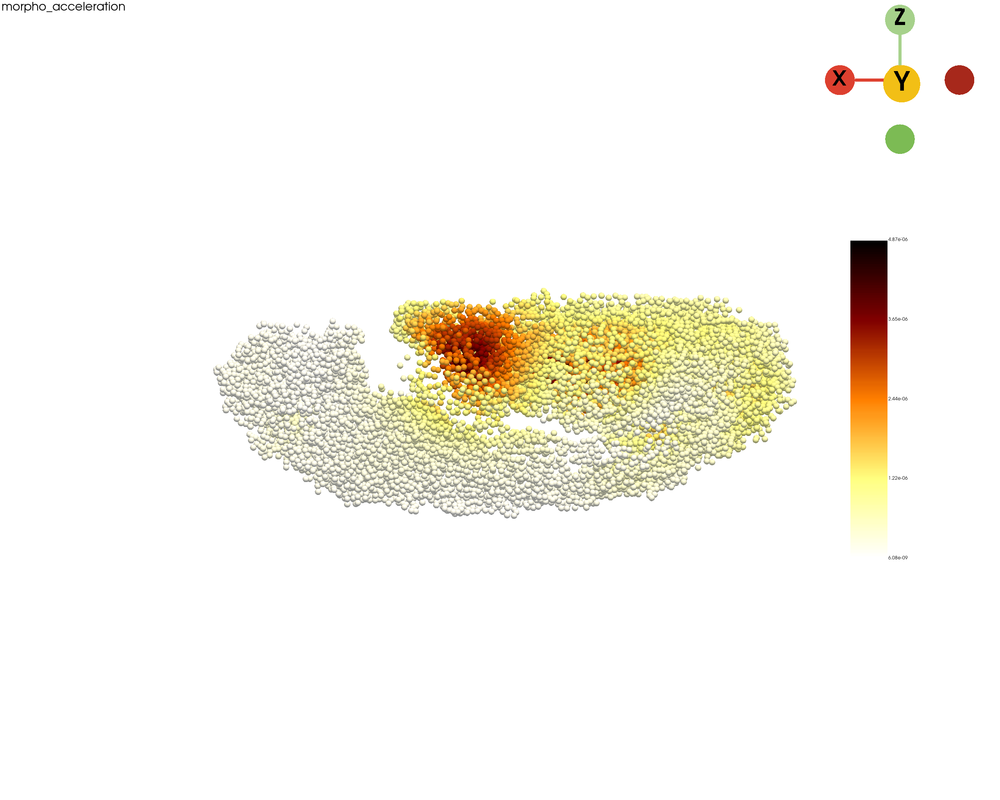

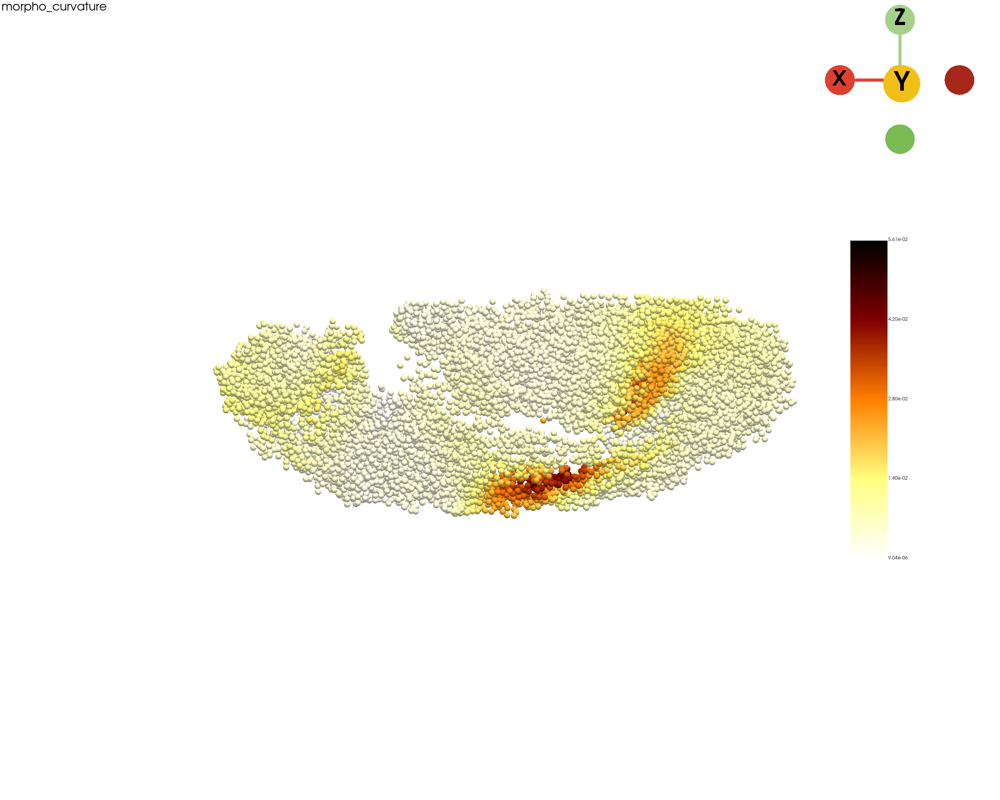

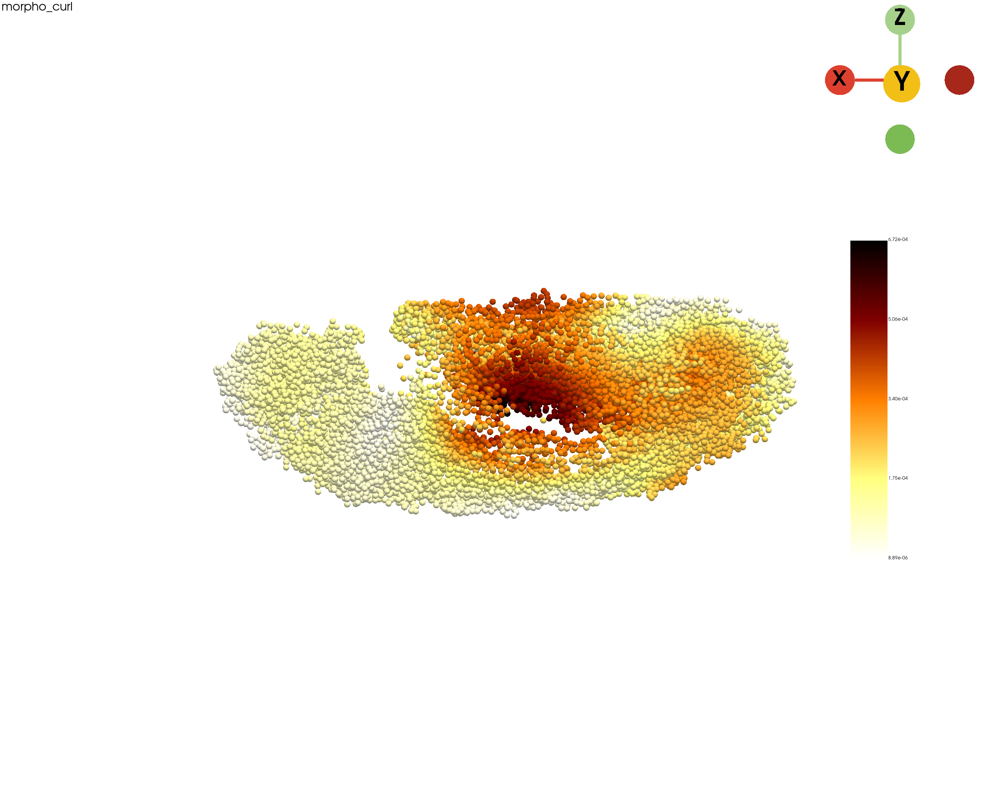

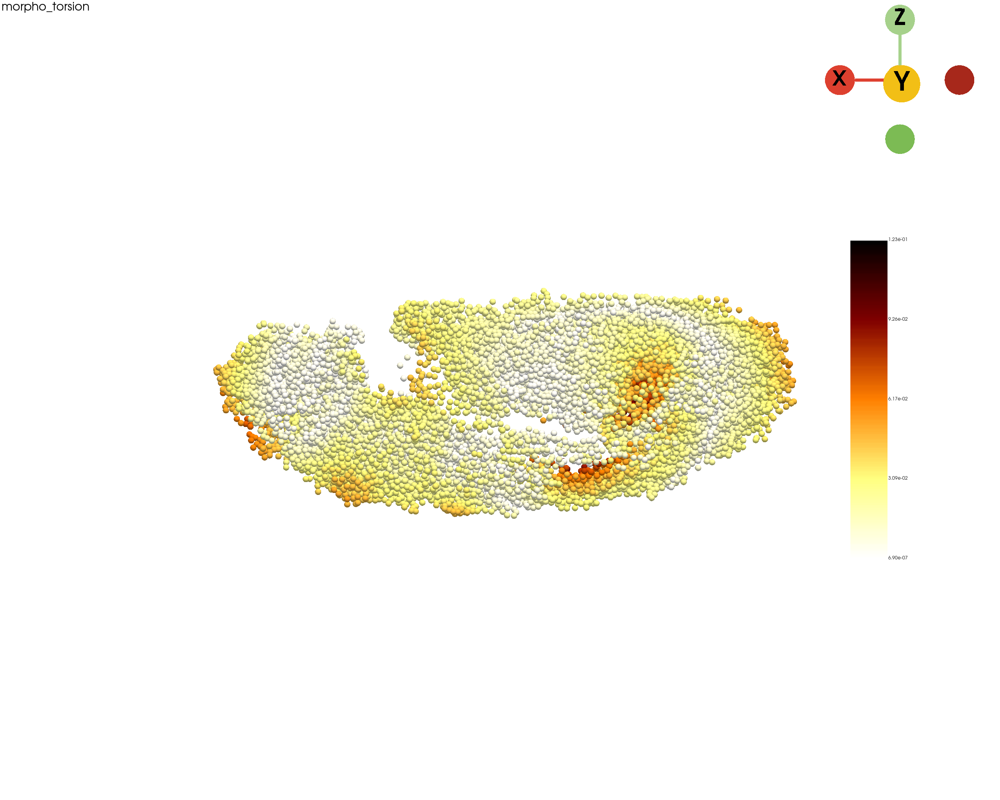

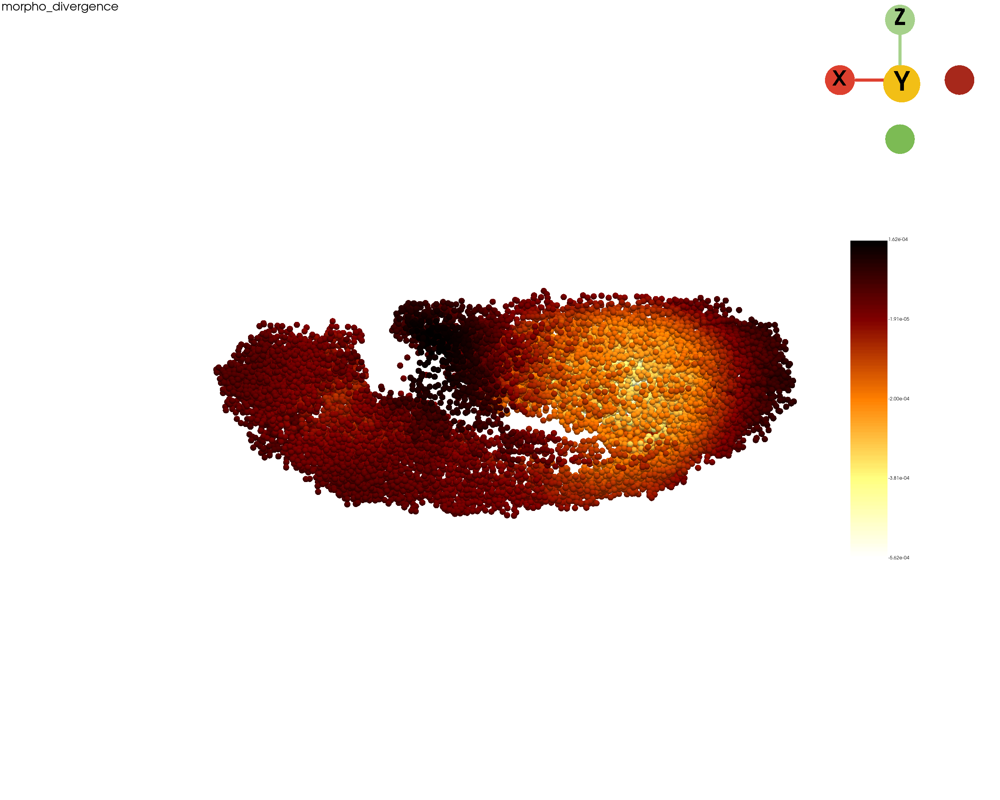

In [10]:
morphometrics_keys = ["morpho_acceleration", "morpho_curvature", "morpho_curl", "morpho_torsion", "morpho_divergence"]
for mk in morphometrics_keys:
    st.tdr.add_model_labels(
        model = germ_pc,
        key_added = mk,
        labels = np.asarray(germ_adata[np.asarray(germ_pc.point_data["obs_index"])].obs[mk]),
        colormap = "afmhot_r",
        where = "point_data",
        inplace = True,
    )
    st.pl.three_d_plot(
        model=st.tdr.collect_models([germ_pc]),
        key=[mk, mk],
        model_style=["points", "surface"],
        model_size=[16, 5],
        opacity=[1, 1],
        colormap=["afmhot_r", "afmhot_r"],
        show_legend=True,
        jupyter="static",
        background="white",
        cpo=cpo,
        window_size=(2560, 2048),
        text=mk,
        filename=os.path.join(out_image_path, f"GB_morphometrics_{mk}_arrows.pdf")
    )

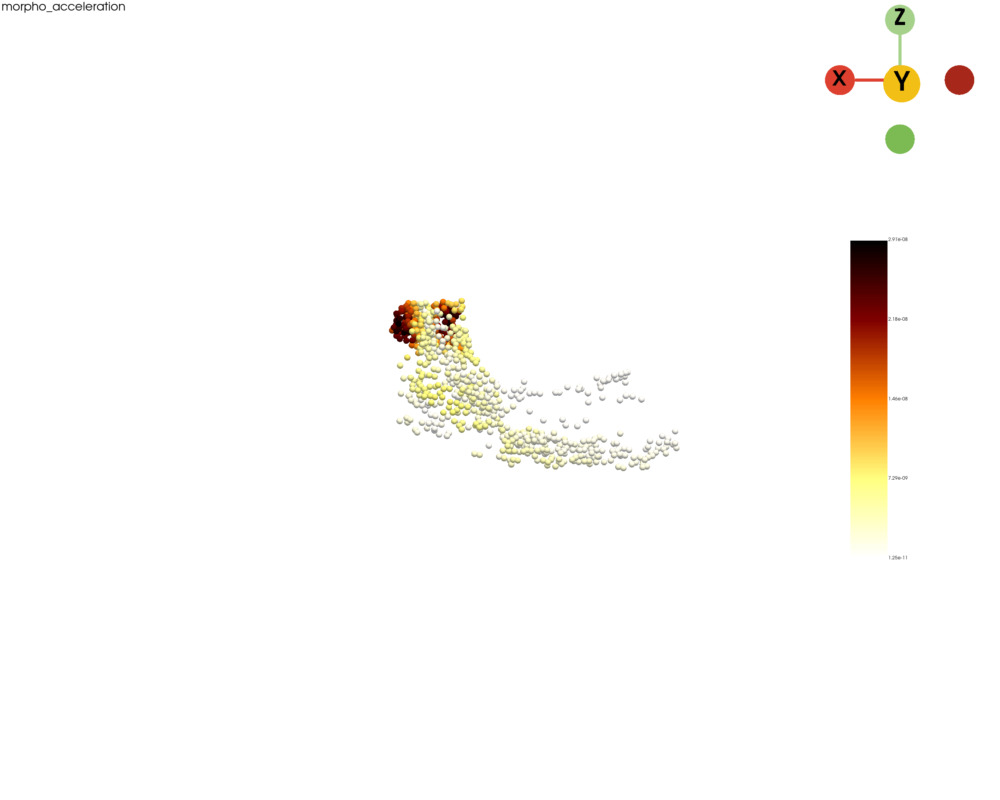

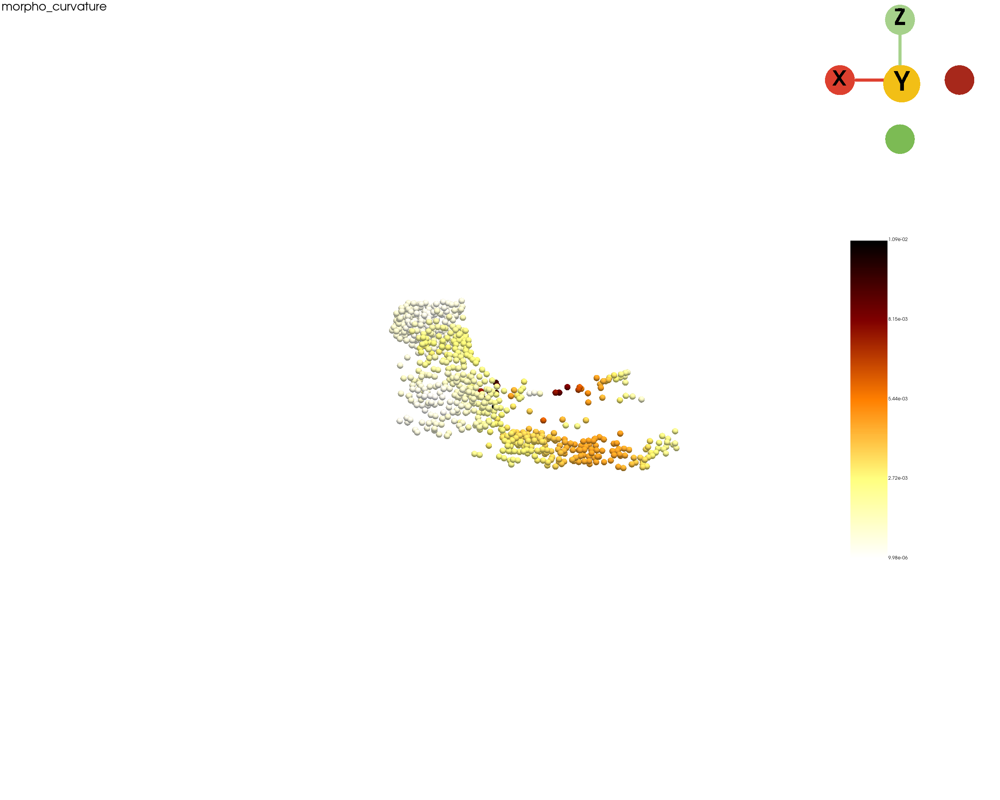

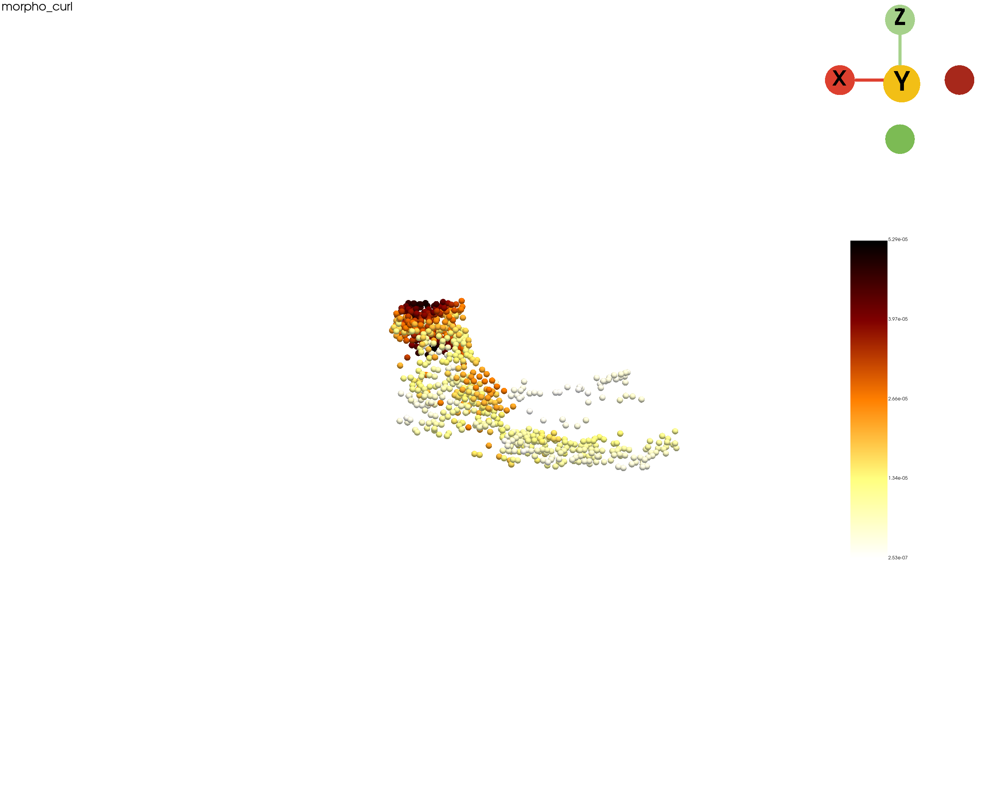

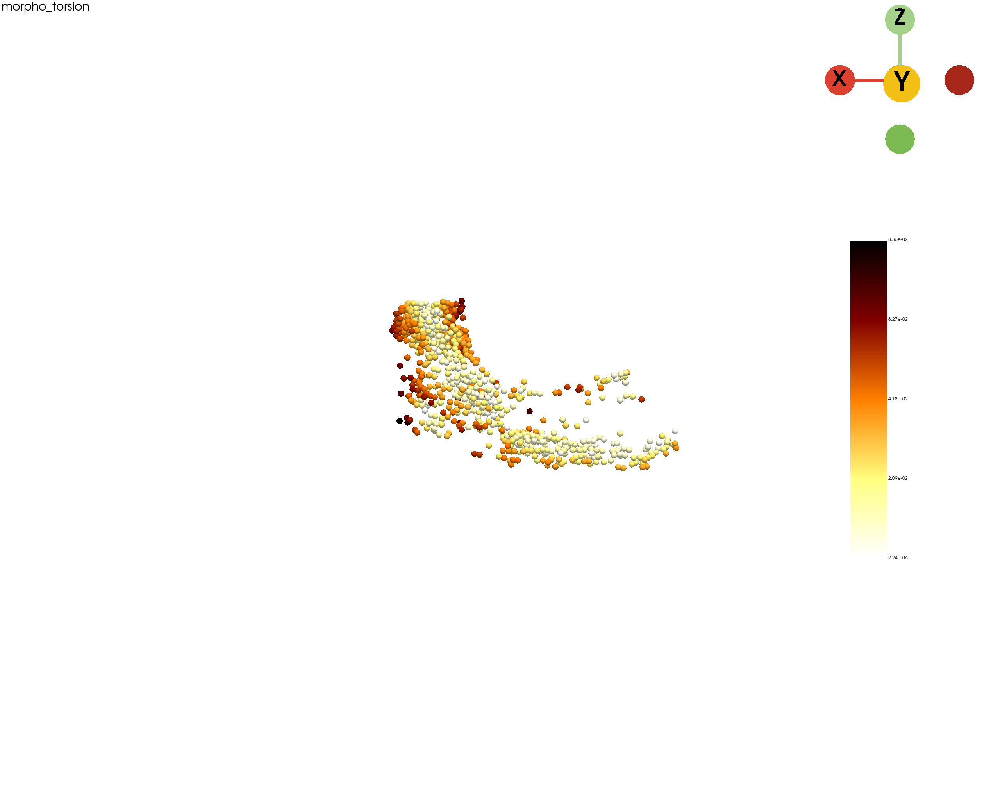

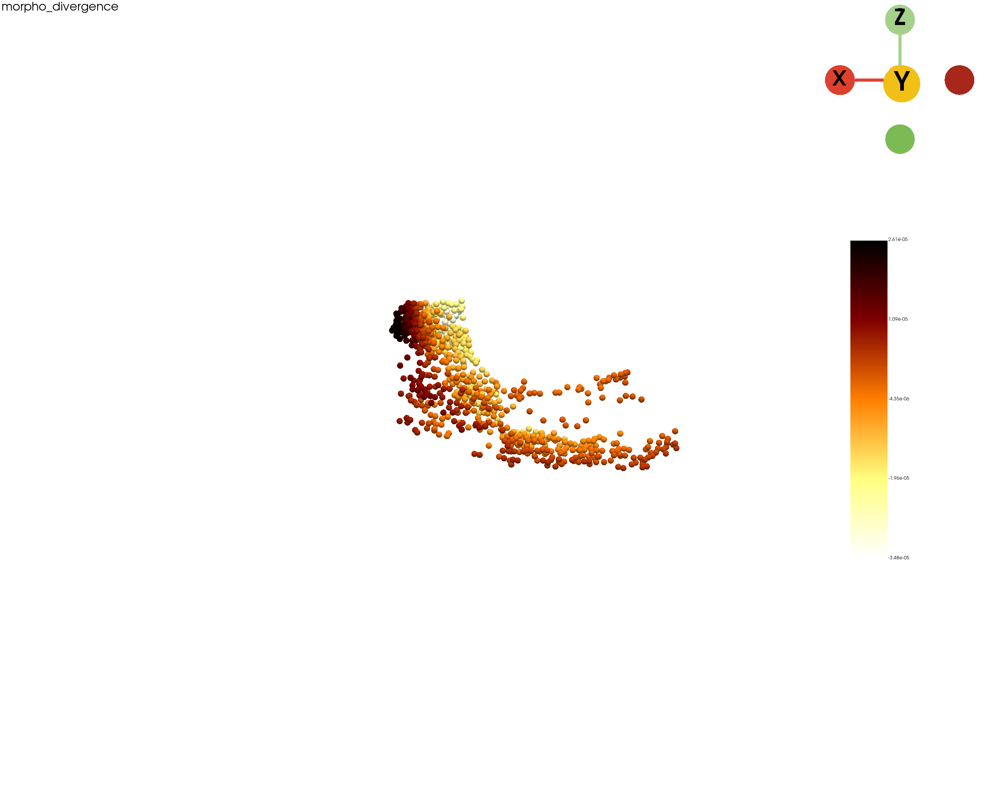

In [26]:
morphometrics_keys = ["morpho_acceleration", "morpho_curvature", "morpho_curl", "morpho_torsion", "morpho_divergence"]
for mk in morphometrics_keys:
    vector_arrows,_ = st.tdr.construct_field(
        model=amn_pc,
        vf_key="vectors",
        arrows_scale_key="vectors",
        n_sampling=None,
        factor=20000,
        key_added=mk,
        label=np.asarray(amn_adata[np.asarray(amn_pc.point_data["obs_index"])].obs[mk]),
        color="afmhot_r",
    )
    st.tdr.add_model_labels(
        model = amn_pc,
        key_added = mk,
        labels = np.asarray(amn_adata[np.asarray(amn_pc.point_data["obs_index"])].obs[mk]),
        colormap = "afmhot_r",
        where = "point_data",
        inplace = True,
    )
    st.pl.three_d_plot(
        model=st.tdr.collect_models([amn_pc, vector_arrows]),
        key=[mk, mk],
        model_style=["points", "surface"],
        model_size=[16, 5],
        opacity=[0.2, 1],
        colormap=["afmhot_r", "afmhot_r"],
        show_legend=True,
        jupyter="static",
        background="white",
        cpo=cpo,
        window_size=(2560, 2048),
        text=mk,
        filename=os.path.join(out_image_path, f"amnioserosa_tail_morphometrics_{mk}_arrows.pdf")
    )

|-----> [Running TRN] in progress: 100.0000%|-----> [Running TRN] completed [6.8373s]


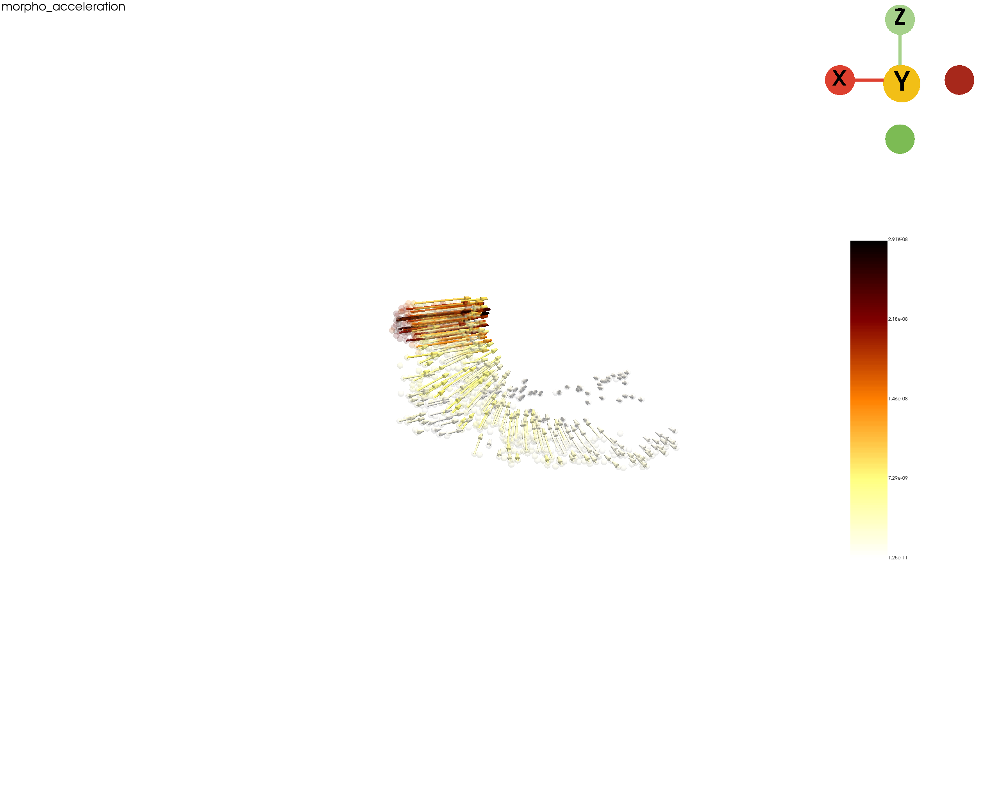

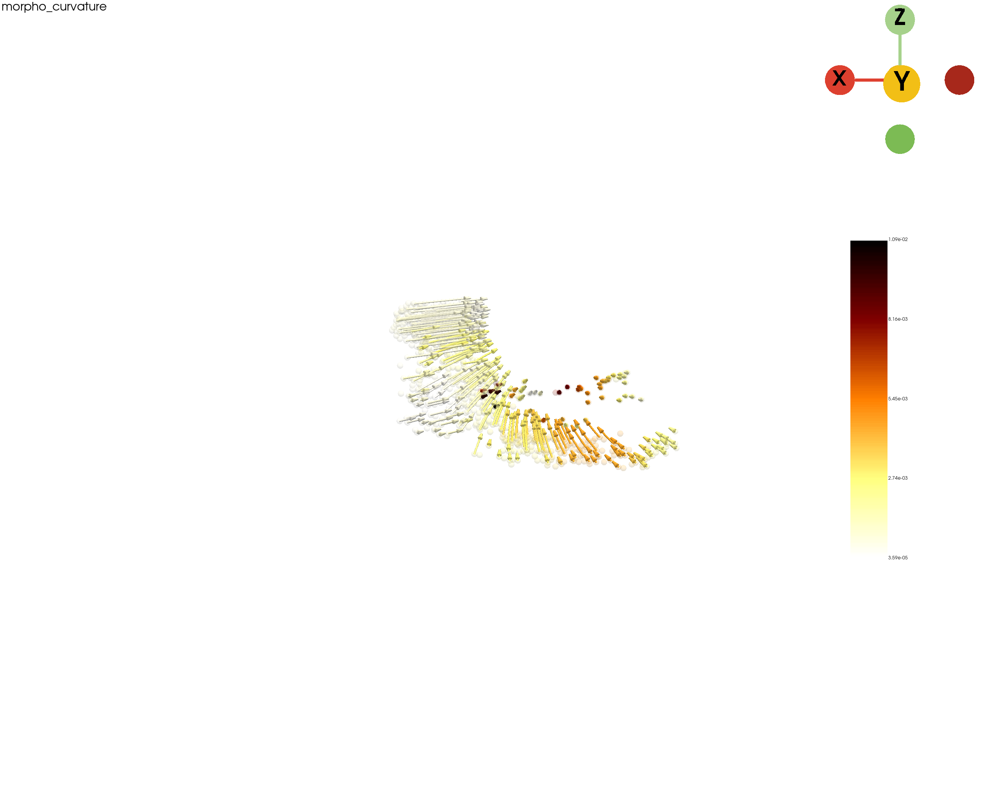

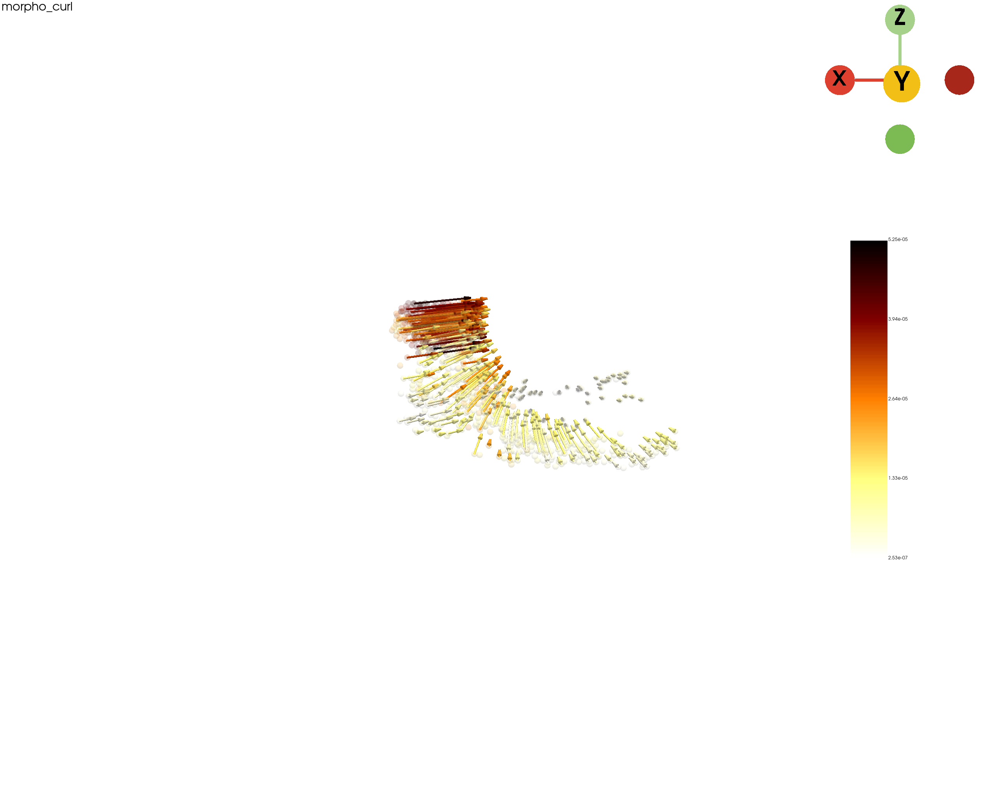

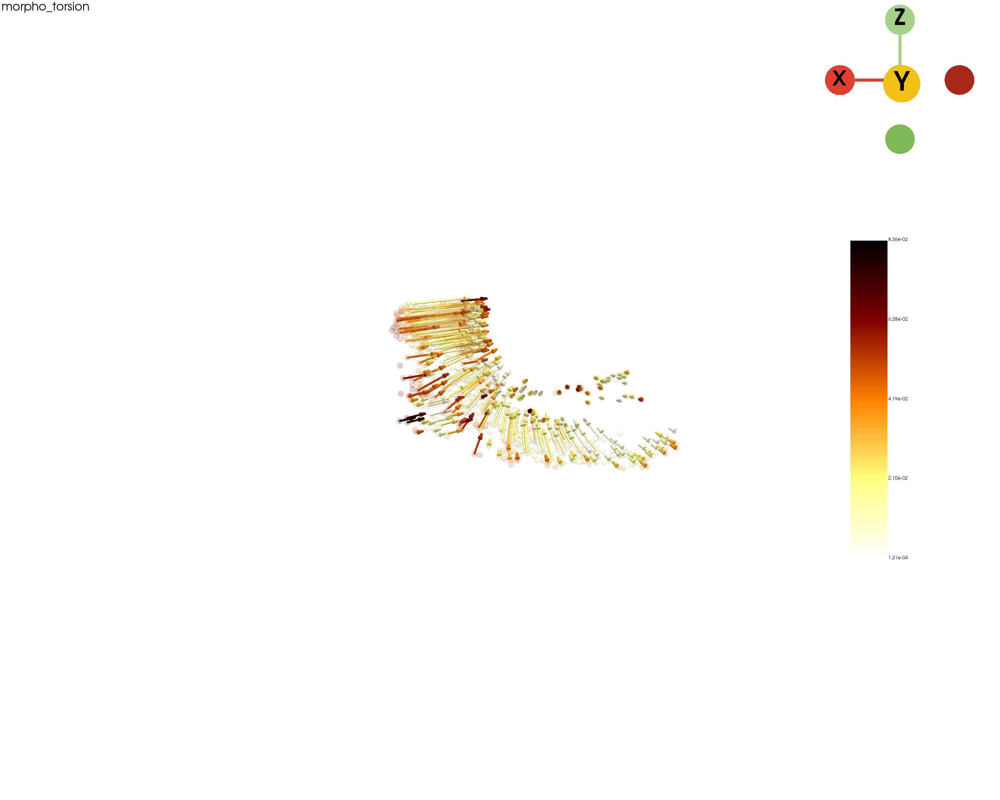

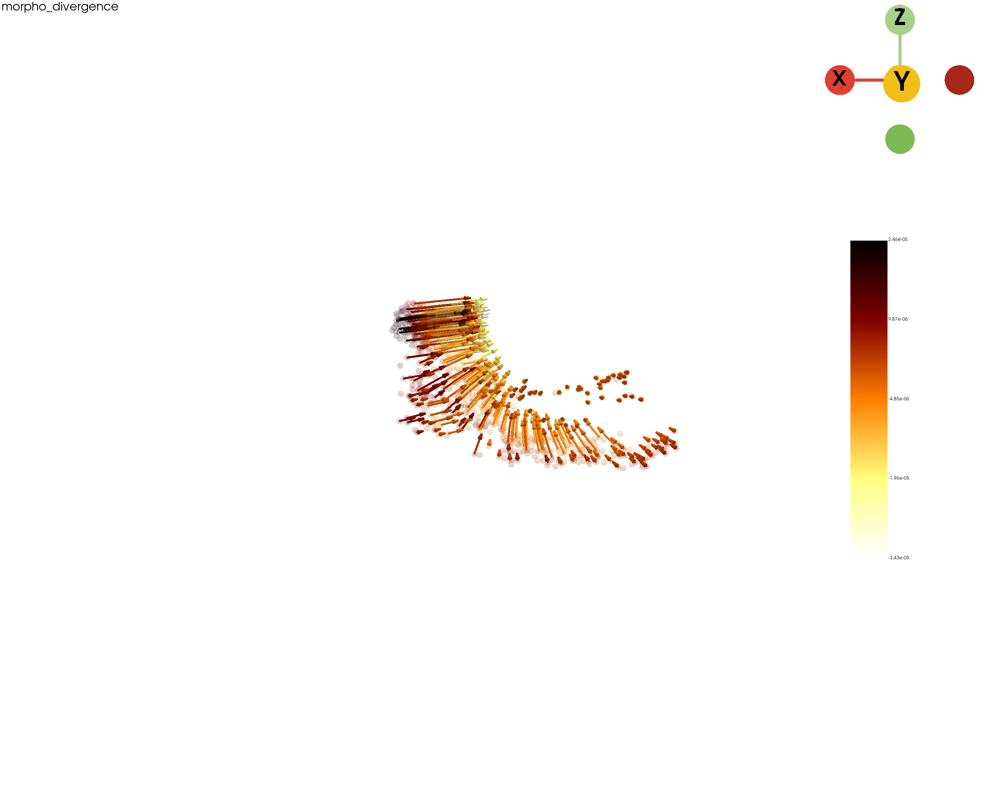

In [28]:
morphometrics_keys = ["morpho_acceleration", "morpho_curvature", "morpho_curl", "morpho_torsion", "morpho_divergence"]
st.tdr.morphopath(
    adata=amn_adata,
    # layer="log1p_X",
    vf_key="VecFld_morpho",
    key_added="fate_morpho",
    t_end=50000,
    interpolation_num=50,
    cores=20
)
amn_trajectory_model, _ = st.tdr.construct_trajectory(
    adata=amn_adata,
    fate_key="fate_morpho",
    n_sampling=300,
    sampling_method="trn",
    key_added="obs_index",
    label=np.asarray(amn_adata.obs.index), # stage1_tissue_adata.uns["VecFld_morpho"]["V"][:, 2].flatten(),
)

for mk in morphometrics_keys:
    st.tdr.add_model_labels(
        model=amn_trajectory_model,
        key_added=mk,
        labels=np.asarray(amn_adata[np.asarray(amn_trajectory_model.point_data["obs_index"])].obs[mk]),
        colormap="Spectral",
        where="point_data",
        inplace=True,
    )
    st.pl.three_d_plot(
        model=st.tdr.collect_models([amn_pc, amn_trajectory_model]),
        key=[mk, mk],
        model_style=["points", "wireframe"],
        model_size=[16, 5],
        opacity=[0.2, 0.5],
        colormap=["afmhot_r", "afmhot_r"],
        show_legend=True,
        jupyter="static",
        background="white",
        cpo=cpo,
        window_size=(2560, 2048),
        text=mk,
        filename=os.path.join(out_image_path, f"amnioserosa_morphometrics_{mk}_trajectory.pdf")
    )

## Save the anndata objects and models

In [29]:
del amn_adata.uns["morpho_torsion"], amn_adata.uns["fate_morpho"]
amn_adata.write_h5ad(os.path.join(out_h5ad_path, f"droso_{sample_id}_amnioserosa_v4.h5ad"), compression="gzip")
st.tdr.save_model(model=amn_pc, filename=os.path.join(out_h5ad_path, "amnioserosa_morphometrics_pc_model.vtk"))
st.tdr.save_model(model=amn_trajectory_model, filename=os.path.join(out_h5ad_path, "amnioserosa_morphometrics_trajectory_model.vtk"))
amn_adata

AnnData object with n_obs × n_vars = 769 × 6729
    obs: 'area', 'slices', 'anno_cell_type', 'anno_tissue', 'anno_germ_layer', 'actual_stage', 'scc', 'anno_tissue_new', 'V_x', 'V_z', 'morpho_acceleration', 'morpho_curvature', 'morpho_curl', 'morpho_torsion', 'morpho_divergence'
    uns: '__type', 'VecFld_morpho'
    obsm: '2d_realign_spatial', '3d_align_spatial', 'V_cells_mapping', 'X_cells_mapping', 'X_pca', 'X_umap', 'raw_spatial', 'tdr_spatial', 'morpho_velocity', 'morpho_acceleration', 'morpho_curvature', 'morpho_curl'
    layers: 'X_counts', 'spliced', 'unspliced'

In [30]:
GNs = [
    "Rab30", "rhea", "Mtl", "srp", "raw", "peb", "ecd", "EcR", "Egfr", "ush", "Rac2", "Rac1", "tup", "yrt", "POSH", "sr", "InR", "ena",
    "Ndg","Ret","scb","mys","Zasp52","muskelin","Pten","Itgbn","Fit2","Fit1","m","mew","Ilk","tyn","Sema2b","if"
]
amn_adata.var.index[amn_adata.var.index.isin(GNs)]

Index(['EcR', 'Egfr', 'Fit1', 'Fit2', 'Ilk', 'InR', 'Mtl', 'Ndg', 'POSH',
       'Pten', 'Rab30', 'Rac1', 'Rac2', 'Ret', 'Sema2b', 'Zasp52', 'ecd',
       'ena', 'if', 'm', 'mew', 'muskelin', 'mys', 'peb', 'raw', 'rhea', 'scb',
       'sr', 'srp', 'tup', 'tyn', 'ush', 'yrt'],
      dtype='object')

In [31]:
import scanpy as sc
amn_adata.X = amn_adata.layers["X_counts"].copy()
sc.pp.normalize_total(amn_adata)
sc.pp.log1p(amn_adata)

In [32]:
for gn in amn_adata.var.index[amn_adata.var.index.isin(GNs)]:
    interpolated_gp_adata = st.tdr.gp_interpolation(source_adata=amn_adata.copy(), spatial_key="3d_align_spatial", keys=gn,
                                                    target_points=np.asarray(amn_pc.points), device="0",
                                                    training_iter=100)
    interpolated_gp_pc, _ = st.tdr.construct_pc(adata=interpolated_gp_adata.copy(), spatial_key="3d_align_spatial", groupby=gn,
                                                key_added=gn)
    _gn = str(gn).replace(":", "_") if ":" in gn else gn
    
    st.pl.three_d_plot(
        model=interpolated_gp_pc,
        key=gn,
        model_style="points",
        model_size=16,
        opacity=0.6,
        colormap="Reds",
        show_legend=True,
        jupyter=False,
        off_screen=True,
        cpo=cpo,
        window_size=(2560, 2048),
        text=gn,
        filename=os.path.join(out_image_path, f"amnioserosa_interpolated_genes_{_gn}.pdf")
    )

{'obs_keys': [], 'var_keys': ['EcR']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 67.69it/s, loss=1.23]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 64.02it/s, loss=1.2]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 94.81it/s, loss=1.17]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 79.40it/s, loss=1.14]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 117.77it/s, loss=1.11]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 69.93it/s, loss=1.08]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 102.28it/s, loss=1.03]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 72.94it/s, loss=1.01]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 78.12it/s, loss=0.985]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 75.93it/s, loss=0.963]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 109.39it/s, loss=0.942]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 68.07it/s, loss=0.923]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 56.19it/s, loss=0.905]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 95.42it/s, loss=0.871]

Minibatch: 100%|██████████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [386.9219s]
{'obs_keys': [], 'var_keys': ['Egfr']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 85.61it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 56.85it/s, loss=1.22]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 55.73it/s, loss=1.19]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 87.30it/s, loss=1.16]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 122.52it/s, loss=1.13]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.77it/s, loss=1.11]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 81.19it/s, loss=1.08]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.74it/s, loss=1.03]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 121.83it/s, loss=1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 69.48it/s, loss=0.978]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 70.93it/s, loss=0.954]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 116.84it/s, loss=0.931]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 88.77it/s, loss=0.909]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 111.75it/s, loss=0.889]

Minibatch: 100%|██████████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [2.4473s]
{'obs_keys': [], 'var_keys': ['Fit1']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 67.62it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 57.63it/s, loss=1.21]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 68.27it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 86.26it/s, loss=1.15]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 127.78it/s, loss=1.13]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 109.42it/s, loss=1.1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 91.58it/s, loss=1.07]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 118.73it/s, loss=1.02]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.62it/s, loss=0.992]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 119.77it/s, loss=0.968]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 97.71it/s, loss=0.944]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 81.33it/s, loss=0.922]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.14it/s, loss=0.902]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 65.15it/s, loss=0.883]

Minibatch: 100%|███████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.6648s]
{'obs_keys': [], 'var_keys': ['Fit2']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 77.58it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 57.73it/s, loss=1.21]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 58.05it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 87.54it/s, loss=1.15]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 121.34it/s, loss=1.13]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 123.59it/s, loss=1.1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 90.16it/s, loss=1.07]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 114.78it/s, loss=1.03]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 121.99it/s, loss=1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 80.95it/s, loss=0.979]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 87.23it/s, loss=0.958]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 112.91it/s, loss=0.937]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 121.38it/s, loss=0.918]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 85.50it/s, loss=0.899]

Minibatch: 100%|██████████|

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.8850s]
{'obs_keys': [], 'var_keys': ['Ilk']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 79.35it/s, loss=1.25]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 51.57it/s, loss=1.22]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 58.14it/s, loss=1.19]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 92.68it/s, loss=1.16]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 107.76it/s, loss=1.13]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 117.69it/s, loss=1.1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 83.70it/s, loss=1.08]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 125.81it/s, loss=1.02]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 86.91it/s, loss=0.995]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 79.89it/s, loss=0.97]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 82.46it/s, loss=0.946]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 123.08it/s, loss=0.924]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 109.01it/s, loss=0.905]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 80.52it/s, loss=0.887]

Minibatch: 100%|█████████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.6071s]
{'obs_keys': [], 'var_keys': ['InR']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 76.90it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 58.52it/s, loss=1.21]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 62.61it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 89.68it/s, loss=1.15]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.90it/s, loss=1.12]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.14it/s, loss=1.1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 127.82it/s, loss=1.07]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 76.55it/s, loss=1.05]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.93it/s, loss=1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 125.93it/s, loss=0.977]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 86.58it/s, loss=0.954]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 91.37it/s, loss=0.933]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.39it/s, loss=0.912]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.61it/s, loss=0.893]

Minibatch: 100%|██████████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.6977s]
{'obs_keys': [], 'var_keys': ['Mtl']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 82.07it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 58.78it/s, loss=1.22]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 61.69it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 85.36it/s, loss=1.16]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 127.46it/s, loss=1.13]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 104.23it/s, loss=1.1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 79.52it/s, loss=1.08]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 102.84it/s, loss=1.03]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 116.65it/s, loss=1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 85.59it/s, loss=0.976]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 88.85it/s, loss=0.952]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 117.69it/s, loss=0.929]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 125.20it/s, loss=0.908]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 88.69it/s, loss=0.887]

Minibatch: 100%|██████████|

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.5796s]
{'obs_keys': [], 'var_keys': ['Ndg']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 85.07it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 58.88it/s, loss=1.21]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 59.76it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 88.86it/s, loss=1.15]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 126.72it/s, loss=1.13]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 117.83it/s, loss=1.1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 91.56it/s, loss=1.08]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 129.29it/s, loss=1.03]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.37it/s, loss=1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 124.67it/s, loss=0.979]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 91.64it/s, loss=0.956]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 90.55it/s, loss=0.933]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 129.39it/s, loss=0.913]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 129.11it/s, loss=0.892]

Minibatch: 100%|██████████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.6191s]
{'obs_keys': [], 'var_keys': ['POSH']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 71.49it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 57.96it/s, loss=1.21]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 64.60it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 83.82it/s, loss=1.15]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 113.65it/s, loss=1.13]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 108.64it/s, loss=1.1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 91.22it/s, loss=1.07]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 123.17it/s, loss=1.02]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 113.56it/s, loss=1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 117.18it/s, loss=0.976]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 59.14it/s, loss=0.952]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 110.41it/s, loss=0.929]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 95.99it/s, loss=0.907]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 111.85it/s, loss=0.887]

Minibatch: 100%|██████████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.6073s]
{'obs_keys': [], 'var_keys': ['Pten']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 85.31it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 61.07it/s, loss=1.22]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 53.41it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 83.05it/s, loss=1.15]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 119.86it/s, loss=1.12]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 117.42it/s, loss=1.09]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 89.66it/s, loss=1.07]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.42it/s, loss=1.02]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.13it/s, loss=0.992]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 95.32it/s, loss=0.97]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 106.62it/s, loss=0.949]

Minibatch: 100%|██████████| 1/1 [00:00<00:00,  6.47it/s, loss=0.93]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 68.00it/s, loss=0.912]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 87.45it/s, loss=0.895]

Minibatch: 100%|█████████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.9191s]
{'obs_keys': [], 'var_keys': ['Rab30']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 73.21it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 51.50it/s, loss=1.21]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 60.17it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 77.69it/s, loss=1.15]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 123.75it/s, loss=1.12]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 115.23it/s, loss=1.09]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 86.79it/s, loss=1.07]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 118.64it/s, loss=1.02]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 123.86it/s, loss=0.992]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 75.24it/s, loss=0.968]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 83.16it/s, loss=0.946]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 101.17it/s, loss=0.925]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 119.98it/s, loss=0.905]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 85.71it/s, loss=0.886]

Minibatch: 100%|██████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.6181s]
{'obs_keys': [], 'var_keys': ['Rac1']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 80.48it/s, loss=1.26]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 59.79it/s, loss=1.23]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 61.17it/s, loss=1.2]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 86.00it/s, loss=1.17]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 125.14it/s, loss=1.15]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 120.43it/s, loss=1.12]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 87.56it/s, loss=1.09]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 97.93it/s, loss=1.04]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 121.55it/s, loss=1.02]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 123.73it/s, loss=0.993]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 90.26it/s, loss=0.969]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 93.23it/s, loss=0.947]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 117.63it/s, loss=0.926]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 127.77it/s, loss=0.906]

Minibatch: 100%|████████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.5684s]
{'obs_keys': [], 'var_keys': ['Rac2']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 78.37it/s, loss=1.26]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 59.27it/s, loss=1.23]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 61.36it/s, loss=1.2]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 84.99it/s, loss=1.17]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 119.40it/s, loss=1.15]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 99.27it/s, loss=1.12]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 83.76it/s, loss=1.09]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 111.93it/s, loss=1.04]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 114.50it/s, loss=1.02]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 70.99it/s, loss=0.993]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 91.07it/s, loss=0.968]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 113.85it/s, loss=0.945]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 87.39it/s, loss=0.923]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 87.21it/s, loss=0.901]

Minibatch: 100%|██████████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.7568s]
{'obs_keys': [], 'var_keys': ['Ret']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 83.12it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 122.46it/s, loss=1.21]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 78.27it/s, loss=1.17]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 121.74it/s, loss=1.14]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 96.91it/s, loss=1.11]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 55.67it/s, loss=1.08]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 56.38it/s, loss=1.05]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 111.37it/s, loss=1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 98.51it/s, loss=0.982]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 81.01it/s, loss=0.96]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 79.19it/s, loss=0.94]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 117.81it/s, loss=0.921]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 105.16it/s, loss=0.904]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 77.93it/s, loss=0.887]

Minibatch: 100%|██████████| 

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [4.9275s]
{'obs_keys': [], 'var_keys': ['Sema2b']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 82.35it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 59.85it/s, loss=1.2]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 59.87it/s, loss=1.17]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 78.57it/s, loss=1.13]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.68it/s, loss=1.1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 120.81it/s, loss=1.07]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 84.31it/s, loss=1.04]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 125.67it/s, loss=0.996]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 123.10it/s, loss=0.975]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 86.29it/s, loss=0.955]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 86.07it/s, loss=0.937]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 116.32it/s, loss=0.921]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.08it/s, loss=0.905]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.87it/s, loss=0.89]

Minibatch: 100%|███████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.5949s]
{'obs_keys': [], 'var_keys': ['Zasp52']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 85.76it/s, loss=1.25]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 58.98it/s, loss=1.22]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 61.15it/s, loss=1.19]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 89.16it/s, loss=1.16]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.59it/s, loss=1.14]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 125.01it/s, loss=1.11]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 89.20it/s, loss=1.08]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 124.38it/s, loss=1.06]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 80.92it/s, loss=1.01]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 83.83it/s, loss=0.988]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 88.61it/s, loss=0.966]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 122.76it/s, loss=0.945]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 120.08it/s, loss=0.926]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 107.43it/s, loss=0.908]

Minibatch: 100%|███████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.7075s]
{'obs_keys': [], 'var_keys': ['ecd']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 81.56it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 56.38it/s, loss=1.21]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 59.72it/s, loss=1.17]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 86.15it/s, loss=1.14]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 104.86it/s, loss=1.11]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 126.21it/s, loss=1.09]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 92.16it/s, loss=1.06]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 122.65it/s, loss=1.01]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 125.40it/s, loss=0.982]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 88.42it/s, loss=0.96]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 116.59it/s, loss=0.939]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 93.23it/s, loss=0.92]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.65it/s, loss=0.902]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.82it/s, loss=0.886]

Minibatch: 100%|███████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.7786s]
{'obs_keys': [], 'var_keys': ['ena']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 79.78it/s, loss=1.25]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 55.54it/s, loss=1.22]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 54.49it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 89.56it/s, loss=1.15]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 124.29it/s, loss=1.13]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 129.17it/s, loss=1.1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 87.41it/s, loss=1.07]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 102.05it/s, loss=1.02]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 124.07it/s, loss=1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 80.40it/s, loss=0.984]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 84.18it/s, loss=0.965]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 125.90it/s, loss=0.948]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 124.14it/s, loss=0.933]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 83.29it/s, loss=0.917]

Minibatch: 100%|██████████|

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.6248s]
{'obs_keys': [], 'var_keys': ['if']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 82.38it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 61.09it/s, loss=1.21]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 59.55it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 84.27it/s, loss=1.15]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 129.08it/s, loss=1.12]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 127.08it/s, loss=1.1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 90.11it/s, loss=1.07]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 107.32it/s, loss=1.03]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 117.67it/s, loss=1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 109.75it/s, loss=0.981]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 93.29it/s, loss=0.959]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 89.39it/s, loss=0.936]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.52it/s, loss=0.915]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 129.75it/s, loss=0.894]

Minibatch: 100%|██████████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.5281s]
{'obs_keys': [], 'var_keys': ['m']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 79.89it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 57.98it/s, loss=1.21]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 59.07it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 87.47it/s, loss=1.15]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 101.75it/s, loss=1.13]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 94.13it/s, loss=1.1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 77.04it/s, loss=1.05]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 110.31it/s, loss=1.02]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 70.20it/s, loss=0.999]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 77.13it/s, loss=0.976]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 75.43it/s, loss=0.954]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 124.19it/s, loss=0.933]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 88.41it/s, loss=0.914]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 121.16it/s, loss=0.876]

Minibatch: 100%|█████████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.7427s]
{'obs_keys': [], 'var_keys': ['mew']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 84.04it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 59.27it/s, loss=1.21]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 61.85it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 84.19it/s, loss=1.15]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 125.07it/s, loss=1.12]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 120.76it/s, loss=1.1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 92.28it/s, loss=1.07]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 120.24it/s, loss=1.02]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 127.60it/s, loss=0.997]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 83.08it/s, loss=0.974]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 89.39it/s, loss=0.952]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 118.49it/s, loss=0.931]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 127.76it/s, loss=0.912]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 125.15it/s, loss=0.893]

Minibatch: 100%|██████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.7396s]
{'obs_keys': [], 'var_keys': ['muskelin']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 85.05it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 52.68it/s, loss=1.21]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 67.36it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 70.63it/s, loss=1.15]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 84.27it/s, loss=1.12]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 103.79it/s, loss=1.09]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 95.35it/s, loss=1.03]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 113.77it/s, loss=1.01]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 82.37it/s, loss=0.983]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 88.58it/s, loss=0.958]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 129.26it/s, loss=0.934]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.51it/s, loss=0.912]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.21it/s, loss=0.891]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 85.64it/s, loss=0.872]

Minibatch: 100%|███████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.5527s]
{'obs_keys': [], 'var_keys': ['mys']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 75.55it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 74.72it/s, loss=1.22]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 58.15it/s, loss=1.19]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 89.16it/s, loss=1.16]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 126.27it/s, loss=1.13]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 99.55it/s, loss=1.11]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 88.35it/s, loss=1.08]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 131.63it/s, loss=1.03]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 124.52it/s, loss=1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 124.34it/s, loss=0.98]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 88.20it/s, loss=0.956]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 94.49it/s, loss=0.933]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 125.83it/s, loss=0.91]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 127.37it/s, loss=0.889]

Minibatch: 100%|██████████| 

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.6541s]
{'obs_keys': [], 'var_keys': ['peb']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 79.14it/s, loss=1.29]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 57.52it/s, loss=1.26]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 56.97it/s, loss=1.23]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 86.95it/s, loss=1.21]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 119.11it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 122.59it/s, loss=1.16]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 83.06it/s, loss=1.13]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 124.66it/s, loss=1.09]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 115.94it/s, loss=1.06]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 79.46it/s, loss=1.04]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 84.61it/s, loss=1.02]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 126.98it/s, loss=0.995]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 126.43it/s, loss=0.974]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.81it/s, loss=0.954]

Minibatch: 100%|████████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.7659s]


{'obs_keys': [], 'var_keys': ['raw']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 80.26it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 55.87it/s, loss=1.21]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 58.01it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 82.47it/s, loss=1.15]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 119.80it/s, loss=1.13]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 76.64it/s, loss=1.1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 95.69it/s, loss=1.05]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 81.98it/s, loss=1.03]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 97.43it/s, loss=1.01]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 57.59it/s, loss=0.982]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 91.28it/s, loss=0.96]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 117.60it/s, loss=0.938]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 84.42it/s, loss=0.918]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 115.45it/s, loss=0.878]

Minibatch: 100%|██████████| 

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.6589s]
{'obs_keys': [], 'var_keys': ['rhea']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 84.07it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 58.00it/s, loss=1.21]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 60.21it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 87.82it/s, loss=1.16]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 114.33it/s, loss=1.13]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 125.55it/s, loss=1.1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 81.56it/s, loss=1.07]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 123.05it/s, loss=1.03]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 94.17it/s, loss=1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 87.45it/s, loss=0.98]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 82.03it/s, loss=0.959]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 125.41it/s, loss=0.939]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 119.95it/s, loss=0.919]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 69.18it/s, loss=0.901]

Minibatch: 100%|██████████| 1

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.6641s]
{'obs_keys': [], 'var_keys': ['scb']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 77.54it/s, loss=1.25]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 59.22it/s, loss=1.23]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 62.65it/s, loss=1.19]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 82.22it/s, loss=1.17]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 114.15it/s, loss=1.14]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 65.05it/s, loss=1.11]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 95.10it/s, loss=1.09]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 116.44it/s, loss=1.03]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 104.43it/s, loss=1.01]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 89.10it/s, loss=0.985]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 86.16it/s, loss=0.96]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 118.15it/s, loss=0.937]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 131.47it/s, loss=0.915]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 88.46it/s, loss=0.894]

Minibatch: 100%|█████████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.6376s]
{'obs_keys': [], 'var_keys': ['sr']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 79.77it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 60.81it/s, loss=1.21]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 61.95it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 86.28it/s, loss=1.15]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 126.93it/s, loss=1.12]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 129.42it/s, loss=1.09]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 93.06it/s, loss=1.06]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 108.24it/s, loss=1.01]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 123.48it/s, loss=0.989]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 86.98it/s, loss=0.965]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 88.85it/s, loss=0.942]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 127.82it/s, loss=0.92]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 116.56it/s, loss=0.9]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 125.02it/s, loss=0.88]

Minibatch: 100%|█████████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.7799s]
{'obs_keys': [], 'var_keys': ['srp']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 62.71it/s, loss=1.26]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 67.62it/s, loss=1.23]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 64.41it/s, loss=1.2]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 86.15it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 123.09it/s, loss=1.15]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 126.78it/s, loss=1.13]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 88.16it/s, loss=1.1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 115.02it/s, loss=1.05]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 129.23it/s, loss=1.03]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 116.06it/s, loss=1.01]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 69.56it/s, loss=0.987]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 87.69it/s, loss=0.967]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 119.19it/s, loss=0.946]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 128.66it/s, loss=0.928]

Minibatch: 100%|█████████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.6831s]
{'obs_keys': [], 'var_keys': ['tup']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 81.66it/s, loss=1.29]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 66.29it/s, loss=1.26]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 65.12it/s, loss=1.23]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 126.33it/s, loss=1.2]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 88.47it/s, loss=1.17]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 125.59it/s, loss=1.14]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 106.24it/s, loss=1.12]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 104.85it/s, loss=1.09]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 119.43it/s, loss=1.04]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 132.56it/s, loss=1.02]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 72.40it/s, loss=0.998]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 88.54it/s, loss=0.978]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 124.14it/s, loss=0.96]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 126.08it/s, loss=0.942]

Minibatch: 100%|████████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.6204s]
{'obs_keys': [], 'var_keys': ['tyn']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 80.06it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 86.36it/s, loss=1.22]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 68.74it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 87.52it/s, loss=1.16]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 108.75it/s, loss=1.13]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 123.60it/s, loss=1.1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 60.00it/s, loss=1.07]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 86.21it/s, loss=1.03]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 83.12it/s, loss=1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 62.11it/s, loss=0.98]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 111.18it/s, loss=0.957]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 122.81it/s, loss=0.936]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 125.65it/s, loss=0.917]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 88.27it/s, loss=0.898]

Minibatch: 100%|██████████| 1

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.6014s]
{'obs_keys': [], 'var_keys': ['ush']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 80.39it/s, loss=1.27]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 56.47it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 56.25it/s, loss=1.21]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 88.84it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 127.24it/s, loss=1.15]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 120.87it/s, loss=1.13]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 89.86it/s, loss=1.1]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 121.64it/s, loss=1.05]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 122.40it/s, loss=1.03]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 122.81it/s, loss=1.01]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 80.10it/s, loss=0.987]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 87.40it/s, loss=0.968]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 126.35it/s, loss=0.951]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 125.10it/s, loss=0.935]

Minibatch: 100%|████████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.7650s]
{'obs_keys': [], 'var_keys': ['yrt']}


Minibatch: 100%|██████████| 1/1 [00:00<00:00, 78.14it/s, loss=1.24]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 56.17it/s, loss=1.21]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 62.77it/s, loss=1.18]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 82.63it/s, loss=1.16]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 121.04it/s, loss=1.13]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 110.22it/s, loss=1.11]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 84.83it/s, loss=1.08]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 126.28it/s, loss=1.03]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 122.43it/s, loss=1.01]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 91.49it/s, loss=0.986]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 82.44it/s, loss=0.963]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 85.93it/s, loss=0.94]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 121.51it/s, loss=0.918]

Minibatch: 100%|██████████| 1/1 [00:00<00:00, 127.49it/s, loss=0.897]

Minibatch: 100%|████████

|-----> Creating an adata object with the interpolated expression...
|-----> [GaussianProcessInterpolation] in progress: 100.0000%
|-----> [GaussianProcessInterpolation] finished [1.5733s]
